In [1]:
import torch

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
else:
    print("WARNING: GPU not available")

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


In [2]:
!pip install -q transformers datasets accelerate evaluate scikit-learn seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 4.9 MB/s eta 0:00:00


In [4]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

from torchvision import transforms

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report
)

from transformers import (
    ViTImageProcessor,
    ViTForImageClassification,
    TrainingArguments,
    Trainer
)

print("All libraries imported successfully!")

All libraries imported successfully!


In [5]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

print("Random seed set to:", SEED)

Random seed set to: 42


In [6]:
!pip install -q datasets transformers accelerate

In [7]:
from datasets import load_dataset

print("Dataset library loaded successfully!")

Dataset library loaded successfully!


In [8]:
dataset = load_dataset(
    "TheKernel01/140k-Real-and-Fake-Faces"
)

print(dataset)

README.md:   0%|          | 0.00/5.06k [00:00<?, ?B/s]

data/train-00000-of-00006.parquet: reconstructing file:   0%|          |  0.00B /  478MB            

data/train-00000-of-00006.parquet: downloading bytes:           |  0.00B            

data/train-00001-of-00006.parquet: reconstructing file:   0%|          |  0.00B /  479MB            

data/train-00001-of-00006.parquet: downloading bytes:           |  0.00B            

data/train-00002-of-00006.parquet: reconstructing file:   0%|          |  0.00B /  479MB            

data/train-00002-of-00006.parquet: downloading bytes:           |  0.00B            

data/train-00003-of-00006.parquet: reconstructing file:   0%|          |  0.00B /  478MB            

data/train-00003-of-00006.parquet: downloading bytes:           |  0.00B            

data/train-00004-of-00006.parquet: reconstructing file:   0%|          |  0.00B /  479MB            

data/train-00004-of-00006.parquet: downloading bytes:           |  0.00B            

data/train-00005-of-00006.parquet: reconstructing file:   0%|          |  0.00B /  478MB            

data/train-00005-of-00006.parquet: downloading bytes:           |  0.00B            

data/validation-00000-of-00002.parquet: reconstructing file:   0%|          |  0.00B /  287MB            

data/validation-00000-of-00002.parquet: downloading bytes:           |  0.00B            

data/validation-00001-of-00002.parquet: reconstructing file:   0%|          |  0.00B /  287MB            

data/validation-00001-of-00002.parquet: downloading bytes:           |  0.00B            

data/test-00000-of-00002.parquet: reconstructing file:   0%|          |  0.00B /  287MB            

data/test-00000-of-00002.parquet: downloading bytes:           |  0.00B            

data/test-00001-of-00002.parquet: reconstructing file:   0%|          |  0.00B /  287MB            

data/test-00001-of-00002.parquet: downloading bytes:           |  0.00B            

Generating train split:   0%|          | 0/100000 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/20000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/20000 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'generator'],
        num_rows: 100000
    })
    validation: Dataset({
        features: ['image', 'label', 'generator'],
        num_rows: 20000
    })
    test: Dataset({
        features: ['image', 'label', 'generator'],
        num_rows: 20000
    })
})


In [9]:
print(dataset)

DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'generator'],
        num_rows: 100000
    })
    validation: Dataset({
        features: ['image', 'label', 'generator'],
        num_rows: 20000
    })
    test: Dataset({
        features: ['image', 'label', 'generator'],
        num_rows: 20000
    })
})


In [10]:
print("Training:", len(dataset["train"]))
print("Validation:", len(dataset["validation"]))
print("Testing:", len(dataset["test"]))

Training: 100000
Validation: 20000
Testing: 20000


In [11]:
sample = dataset["train"][0]

print(sample.keys())

dict_keys(['image', 'label', 'generator'])


In [12]:
print("Label:", sample["label"])
print("Generator:", sample["generator"])
print("Image:", sample["image"])

Label: 0
Generator: 0
Image: <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256 at 0x7C87FCD402F0>


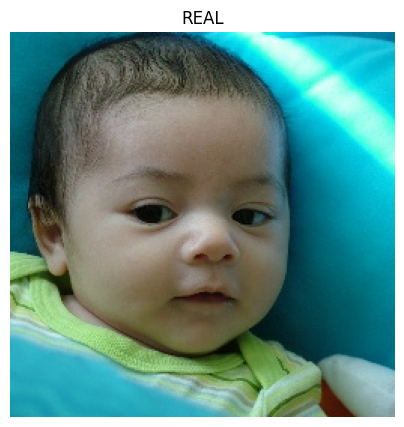

In [13]:
import matplotlib.pyplot as plt

plt.figure(figsize=(5, 5))
plt.imshow(sample["image"])
plt.axis("off")

if sample["label"] == 0:
    plt.title("REAL")
else:
    plt.title("FAKE")

plt.show()

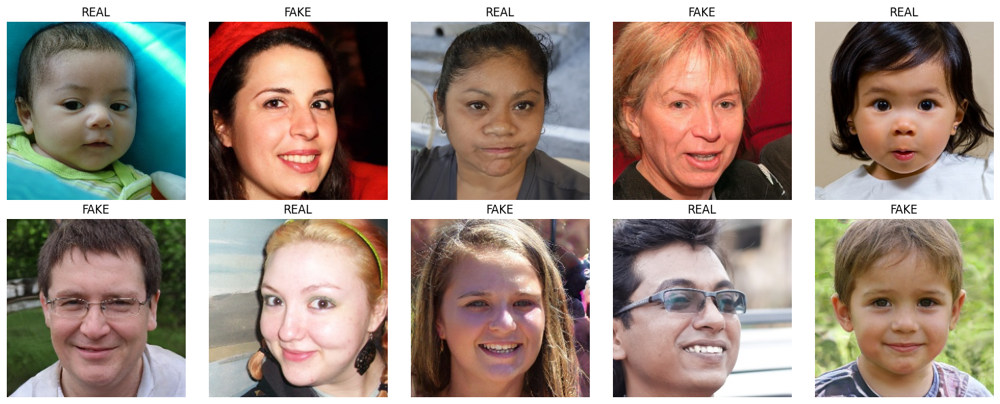

In [14]:
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, ax in enumerate(axes.flatten()):

    sample = dataset["train"][i]

    ax.imshow(sample["image"])

    label = "REAL" if sample["label"] == 0 else "FAKE"

    ax.set_title(label)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [15]:
from collections import Counter

train_labels = dataset["train"]["label"]

counts = Counter(train_labels)

print("Real:", counts[0])
print("Fake:", counts[1])

Real: 50000
Fake: 50000


In [16]:
TRAIN_SIZE = 20000
VAL_SIZE = 4000
TEST_SIZE = 4000

train_dataset = dataset["train"].shuffle(
    seed=42
).select(range(TRAIN_SIZE))

val_dataset = dataset["validation"].shuffle(
    seed=42
).select(range(VAL_SIZE))

test_dataset = dataset["test"].shuffle(
    seed=42
).select(range(TEST_SIZE))

print("Training:", len(train_dataset))
print("Validation:", len(val_dataset))
print("Testing:", len(test_dataset))

Training: 20000
Validation: 4000
Testing: 4000


In [17]:
print(dataset["train"].features)

{'image': Image(mode=None, decode=True), 'label': ClassLabel(names=['real', 'fake']), 'generator': ClassLabel(names=['Real', 'StyleGAN'])}


In [18]:
print(dataset["train"].features["label"])

ClassLabel(names=['real', 'fake'])


In [19]:
print(dataset)
print(dataset["train"].features)

DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'generator'],
        num_rows: 100000
    })
    validation: Dataset({
        features: ['image', 'label', 'generator'],
        num_rows: 20000
    })
    test: Dataset({
        features: ['image', 'label', 'generator'],
        num_rows: 20000
    })
})
{'image': Image(mode=None, decode=True), 'label': ClassLabel(names=['real', 'fake']), 'generator': ClassLabel(names=['Real', 'StyleGAN'])}


In [20]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from torch.utils.data import DataLoader
from torchvision import transforms

from transformers import (
    ViTImageProcessor,
    ViTForImageClassification,
    TrainingArguments,
    Trainer
)

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report
)

print("Libraries imported successfully!")

Libraries imported successfully!


In [21]:
device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Device:", device)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

Device: cuda
GPU: Tesla T4


In [22]:
import random

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

print("Random seed:", SEED)

Random seed: 42


In [23]:
MODEL_NAME = "google/vit-base-patch16-224"

processor = ViTImageProcessor.from_pretrained(
    MODEL_NAME
)

print("Image processor loaded!")
print("Image mean:", processor.image_mean)
print("Image std:", processor.image_std)

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

Image processor loaded!
Image mean: (0.5, 0.5, 0.5)
Image std: (0.5, 0.5, 0.5)


In [24]:
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.RandomHorizontalFlip(p=0.5),

    transforms.RandomRotation(10),

    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=processor.image_mean,
        std=processor.image_std
    )
])

In [25]:
val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=processor.image_mean,
        std=processor.image_std
    )
])

In [31]:
def preprocess_train(example):
    image = example["image"]

    # Handle both a single image and a list of images
    if isinstance(image, list):
        pixel_values = [
            train_transform(img.convert("RGB"))
            for img in image
        ]
    else:
        pixel_values = train_transform(
            image.convert("RGB")
        )

    example["pixel_values"] = pixel_values

    return example

In [32]:
def preprocess_val_test(example):
    image = example["image"]

    # Handle both a single image and a list of images
    if isinstance(image, list):
        pixel_values = [
            val_test_transform(img.convert("RGB"))
            for img in image
        ]
    else:
        pixel_values = val_test_transform(
            image.convert("RGB")
        )

    example["pixel_values"] = pixel_values

    return example

In [33]:
train_processed = train_dataset.with_transform(
    preprocess_train
)

val_processed = val_dataset.with_transform(
    preprocess_val_test
)

test_processed = test_dataset.with_transform(
    preprocess_val_test
)

print("Datasets successfully prepared!")

Datasets successfully prepared!


In [34]:
sample = train_processed[0]

print(sample.keys())
print("Pixel values shape:", sample["pixel_values"].shape)
print("Label:", sample["label"])

dict_keys(['image', 'label', 'generator', 'pixel_values'])
Pixel values shape: torch.Size([3, 224, 224])
Label: 0


In [35]:
id2label = {
    0: "REAL",
    1: "FAKE"
}

label2id = {
    "REAL": 0,
    "FAKE": 1
}

model = ViTForImageClassification.from_pretrained(
    MODEL_NAME,
    num_labels=2,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)

print("ViT model loaded successfully!")

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

[transformers] You passed `num_labels=2` which is incompatible to the `id2label` map of length `1000`.


model.safetensors: reconstructing file:   0%|          |  0.00B /  346MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

[transformers] ViTForImageClassification LOAD REPORT from: google/vit-base-patch16-224
Key               | Status   |                                                                                          
------------------+----------+------------------------------------------------------------------------------------------
classifier.weight | MISMATCH | Reinit due to size mismatch - ckpt: torch.Size([1000, 768]) vs model:torch.Size([2, 768])
classifier.bias   | MISMATCH | Reinit due to size mismatch - ckpt: torch.Size([1000]) vs model:torch.Size([2])          

Notes:
- MISMATCH:	ckpt weights were loaded, but they did not match the original empty weight shapes.


ViT model loaded successfully!


In [36]:
model = model.to(device)

print("Model is using:", device)

Model is using: cuda


In [37]:
def compute_metrics(eval_pred):
    logits, labels = eval_pred

    predictions = np.argmax(logits, axis=-1)

    accuracy = accuracy_score(labels, predictions)
    precision = precision_score(labels, predictions, zero_division=0)
    recall = recall_score(labels, predictions, zero_division=0)
    f1 = f1_score(labels, predictions, zero_division=0)

    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }

print("Metrics function created successfully!")

Metrics function created successfully!


In [38]:
def preprocess_train(example):
    image = example["image"]

    if isinstance(image, list):
        pixel_values = [
            train_transform(img.convert("RGB"))
            for img in image
        ]
        labels = example["label"]
    else:
        pixel_values = train_transform(image.convert("RGB"))
        labels = example["label"]

    return {
        "pixel_values": pixel_values,
        "labels": labels
    }


def preprocess_val_test(example):
    image = example["image"]

    if isinstance(image, list):
        pixel_values = [
            val_test_transform(img.convert("RGB"))
            for img in image
        ]
        labels = example["label"]
    else:
        pixel_values = val_test_transform(image.convert("RGB"))
        labels = example["label"]

    return {
        "pixel_values": pixel_values,
        "labels": labels
    }

In [39]:
train_processed = train_dataset.with_transform(preprocess_train)
val_processed = val_dataset.with_transform(preprocess_val_test)
test_processed = test_dataset.with_transform(preprocess_val_test)

print("Processed datasets recreated successfully!")

Processed datasets recreated successfully!


In [40]:
sample = train_processed[0]

print(sample.keys())
print("Pixel values shape:", sample["pixel_values"].shape)
print("Labels:", sample["labels"])

dict_keys(['pixel_values', 'labels'])
Pixel values shape: torch.Size([3, 224, 224])
Labels: 0


In [42]:
id2label = {
    0: "REAL",
    1: "FAKE"
}

label2id = {
    "REAL": 0,
    "FAKE": 1
}

model = ViTForImageClassification.from_pretrained(
    MODEL_NAME,
    num_labels=2,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True
)

print("ViT model loaded successfully!")

[transformers] You passed `num_labels=2` which is incompatible to the `id2label` map of length `1000`.


Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

[transformers] ViTForImageClassification LOAD REPORT from: google/vit-base-patch16-224
Key               | Status   |                                                                                          
------------------+----------+------------------------------------------------------------------------------------------
classifier.weight | MISMATCH | Reinit due to size mismatch - ckpt: torch.Size([1000, 768]) vs model:torch.Size([2, 768])
classifier.bias   | MISMATCH | Reinit due to size mismatch - ckpt: torch.Size([1000]) vs model:torch.Size([2])          

Notes:
- MISMATCH:	ckpt weights were loaded, but they did not match the original empty weight shapes.


ViT model loaded successfully!


In [43]:
model = model.to(device)

print("Model is using:", device)

Model is using: cuda


In [44]:
def compute_metrics(eval_pred):
    logits, labels = eval_pred

    predictions = np.argmax(logits, axis=-1)

    accuracy = accuracy_score(labels, predictions)
    precision = precision_score(labels, predictions, zero_division=0)
    recall = recall_score(labels, predictions, zero_division=0)
    f1 = f1_score(labels, predictions, zero_division=0)

    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }

print("Metrics function created successfully!")

Metrics function created successfully!


In [47]:
import transformers

print("Transformers version:", transformers.__version__)

Transformers version: 5.16.1


In [49]:
import inspect
import transformers

print("Transformers version:", transformers.__version__)

print("\nTrainingArguments parameters:")
print(inspect.signature(TrainingArguments))

Transformers version: 5.16.1

TrainingArguments parameters:
(output_dir: str | None = None, per_device_train_batch_size: int = 8, num_train_epochs: float = 3.0, max_steps: int = -1, learning_rate: float = 5e-05, lr_scheduler_type: transformers.trainer_utils.SchedulerType | str = 'linear', lr_scheduler_kwargs: dict | str | None = None, warmup_steps: float = 0, optim: transformers.training_args.OptimizerNames | str = 'adamw_torch_fused', optim_args: str | None = None, weight_decay: float = 0.0, adam_beta1: float = 0.9, adam_beta2: float = 0.999, adam_epsilon: float = 1e-08, optim_target_modules: None | str | list[str] = None, gradient_accumulation_steps: int = 1, average_tokens_across_devices: bool = True, max_grad_norm: float = 1.0, label_smoothing_factor: float = 0.0, bf16: bool = False, fp16: bool = False, bf16_full_eval: bool = False, fp16_full_eval: bool = False, tf32: bool | None = None, gradient_checkpointing: bool = False, gradient_checkpointing_kwargs: dict[str, typing.Any] | st

In [50]:
from transformers import TrainingArguments

print("TrainingArguments reloaded successfully!")

TrainingArguments reloaded successfully!


In [56]:
training_args = TrainingArguments(
    output_dir="/content/vit_deepfake_results",

    eval_strategy="epoch",

    learning_rate=5e-5,

    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,

    num_train_epochs=5,

    weight_decay=0.01,

    logging_steps=100,

    fp16=torch.cuda.is_available(),

    report_to="none",

    remove_unused_columns=False
)

print("Training arguments updated successfully!")

Training arguments updated successfully!


In [58]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_processed,
    eval_dataset=val_processed,
    compute_metrics=compute_metrics
)

print("Trainer recreated successfully!")

Trainer recreated successfully!


In [59]:
test_sample = train_processed[0]

print("Keys:", test_sample.keys())
print("Pixel values shape:", test_sample["pixel_values"].shape)
print("Label:", test_sample["labels"])

Keys: dict_keys(['pixel_values', 'labels'])
Pixel values shape: torch.Size([3, 224, 224])
Label: 0


In [60]:
train_result = trainer.train()

print("Training completed successfully!")

Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.086610,0.045074,0.984250,0.981382,0.987673,0.984517
2,0.035695,0.037945,0.988750,0.986745,0.991124,0.988930
3,0.019686,0.029928,0.993250,0.989242,0.997535,0.993371
4,0.013612,0.017751,0.995250,0.998017,0.992604,0.995303
5,0.003346,0.012818,0.996500,0.996548,0.996548,0.996548


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Training completed successfully!


In [61]:
validation_results = trainer.evaluate()

print("VALIDATION RESULTS")
print("------------------")

for key, value in validation_results.items():
    if isinstance(value, float):
        print(f"{key}: {value:.4f}")
    else:
        print(f"{key}: {value}")

Training Loss,Validation Loss,Epoch,Accuracy,Precision,Recall,F1
0.003346,0.012818,5,0.996500,0.996548,0.996548,0.996548


VALIDATION RESULTS
------------------
eval_loss: 0.0128
eval_accuracy: 0.9965
eval_precision: 0.9965
eval_recall: 0.9965
eval_f1: 0.9965


In [62]:
test_results = trainer.predict(test_processed)

print("TEST RESULTS")
print("------------")

for key, value in test_results.metrics.items():
    if isinstance(value, float):
        print(f"{key}: {value:.4f}")
    else:
        print(f"{key}: {value}")

TEST RESULTS
------------
test_loss: 0.0099
test_accuracy: 0.9978
test_precision: 0.9980
test_recall: 0.9975
test_f1: 0.9978
test_runtime: 28.4382
test_samples_per_second: 140.6560
test_steps_per_second: 8.7910


In [63]:
predictions = np.argmax(test_results.predictions, axis=1)
true_labels = test_results.label_ids

print("Number of predictions:", len(predictions))
print("Number of true labels:", len(true_labels))

Number of predictions: 4000
Number of true labels: 4000


In [64]:
test_accuracy = accuracy_score(true_labels, predictions)

test_precision = precision_score(
    true_labels,
    predictions,
    zero_division=0
)

test_recall = recall_score(
    true_labels,
    predictions,
    zero_division=0
)

test_f1 = f1_score(
    true_labels,
    predictions,
    zero_division=0
)

print("FINAL TEST PERFORMANCE")
print("----------------------")
print(f"Accuracy :  {test_accuracy:.4f}")
print(f"Precision:  {test_precision:.4f}")
print(f"Recall   :  {test_recall:.4f}")
print(f"F1 Score :  {test_f1:.4f}")

FINAL TEST PERFORMANCE
----------------------
Accuracy :  0.9978
Precision:  0.9980
Recall   :  0.9975
F1 Score :  0.9978


In [65]:
report = classification_report(
    true_labels,
    predictions,
    target_names=["REAL", "FAKE"],
    digits=4
)

print(report)

              precision    recall  f1-score   support

        REAL     0.9975    0.9980    0.9977      1972
        FAKE     0.9980    0.9975    0.9978      2028

    accuracy                         0.9978      4000
   macro avg     0.9977    0.9978    0.9977      4000
weighted avg     0.9978    0.9978    0.9978      4000



In [66]:
cm = confusion_matrix(true_labels, predictions)

print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[1968    4]
 [   5 2023]]


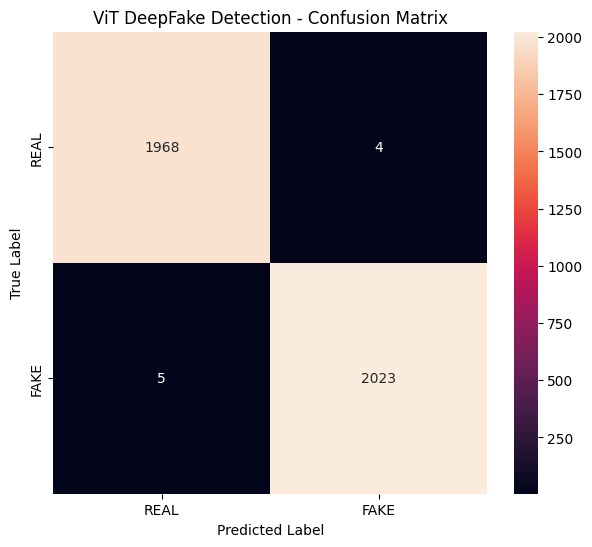

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 6))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    xticklabels=["REAL", "FAKE"],
    yticklabels=["REAL", "FAKE"]
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("ViT DeepFake Detection - Confusion Matrix")

plt.show()

In [68]:
history = trainer.state.log_history

print("Number of logged entries:", len(history))

for entry in history:
    print(entry)

Number of logged entries: 69
{'loss': 0.5091513442993164, 'grad_norm': 6.491711616516113, 'learning_rate': 4.920800000000001e-05, 'epoch': 0.08, 'step': 100}
{'loss': 0.3151382827758789, 'grad_norm': 5.4999542236328125, 'learning_rate': 4.8408e-05, 'epoch': 0.16, 'step': 200}
{'loss': 0.27639835357666015, 'grad_norm': 8.504898071289062, 'learning_rate': 4.7608e-05, 'epoch': 0.24, 'step': 300}
{'loss': 0.264611701965332, 'grad_norm': 14.693016052246094, 'learning_rate': 4.6808e-05, 'epoch': 0.32, 'step': 400}
{'loss': 0.18519313812255858, 'grad_norm': 8.810670852661133, 'learning_rate': 4.6008000000000004e-05, 'epoch': 0.4, 'step': 500}
{'loss': 0.1983414649963379, 'grad_norm': 6.735972881317139, 'learning_rate': 4.5208e-05, 'epoch': 0.48, 'step': 600}
{'loss': 0.17349220275878907, 'grad_norm': 8.190323829650879, 'learning_rate': 4.4408e-05, 'epoch': 0.56, 'step': 700}
{'loss': 0.140062198638916, 'grad_norm': 0.7599633932113647, 'learning_rate': 4.360800000000001e-05, 'epoch': 0.64, 'st

In [69]:
history = trainer.state.log_history

print("Number of logged entries:", len(history))

for entry in history:
    print(entry)

Number of logged entries: 69
{'loss': 0.5091513442993164, 'grad_norm': 6.491711616516113, 'learning_rate': 4.920800000000001e-05, 'epoch': 0.08, 'step': 100}
{'loss': 0.3151382827758789, 'grad_norm': 5.4999542236328125, 'learning_rate': 4.8408e-05, 'epoch': 0.16, 'step': 200}
{'loss': 0.27639835357666015, 'grad_norm': 8.504898071289062, 'learning_rate': 4.7608e-05, 'epoch': 0.24, 'step': 300}
{'loss': 0.264611701965332, 'grad_norm': 14.693016052246094, 'learning_rate': 4.6808e-05, 'epoch': 0.32, 'step': 400}
{'loss': 0.18519313812255858, 'grad_norm': 8.810670852661133, 'learning_rate': 4.6008000000000004e-05, 'epoch': 0.4, 'step': 500}
{'loss': 0.1983414649963379, 'grad_norm': 6.735972881317139, 'learning_rate': 4.5208e-05, 'epoch': 0.48, 'step': 600}
{'loss': 0.17349220275878907, 'grad_norm': 8.190323829650879, 'learning_rate': 4.4408e-05, 'epoch': 0.56, 'step': 700}
{'loss': 0.140062198638916, 'grad_norm': 0.7599633932113647, 'learning_rate': 4.360800000000001e-05, 'epoch': 0.64, 'st

In [70]:
import matplotlib.pyplot as plt

history = trainer.state.log_history

# Extract training loss
train_loss = []
train_epochs = []

# Extract validation metrics
val_loss = []
val_accuracy = []
val_f1 = []
val_epochs = []

for entry in history:
    if "loss" in entry and "epoch" in entry:
        train_loss.append(entry["loss"])
        train_epochs.append(entry["epoch"])

    if "eval_loss" in entry:
        val_loss.append(entry["eval_loss"])
        val_accuracy.append(entry["eval_accuracy"])
        val_f1.append(entry["eval_f1"])
        val_epochs.append(entry["epoch"])

print("Training loss points:", len(train_loss))
print("Validation points:", len(val_loss))

Training loss points: 62
Validation points: 6


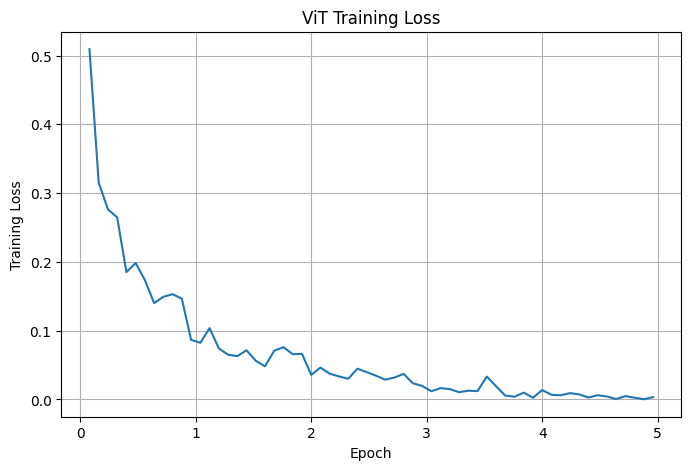

In [71]:
plt.figure(figsize=(8, 5))

plt.plot(train_epochs, train_loss)

plt.xlabel("Epoch")
plt.ylabel("Training Loss")
plt.title("ViT Training Loss")

plt.grid(True)
plt.show()

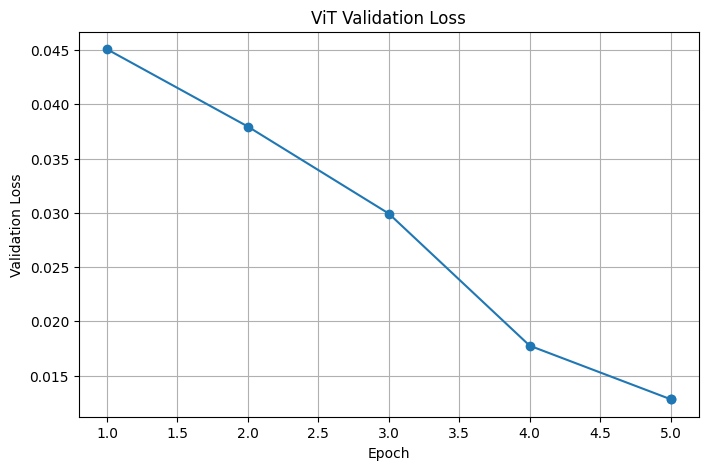

In [72]:
plt.figure(figsize=(8, 5))

plt.plot(val_epochs, val_loss, marker="o")

plt.xlabel("Epoch")
plt.ylabel("Validation Loss")
plt.title("ViT Validation Loss")

plt.grid(True)
plt.show()

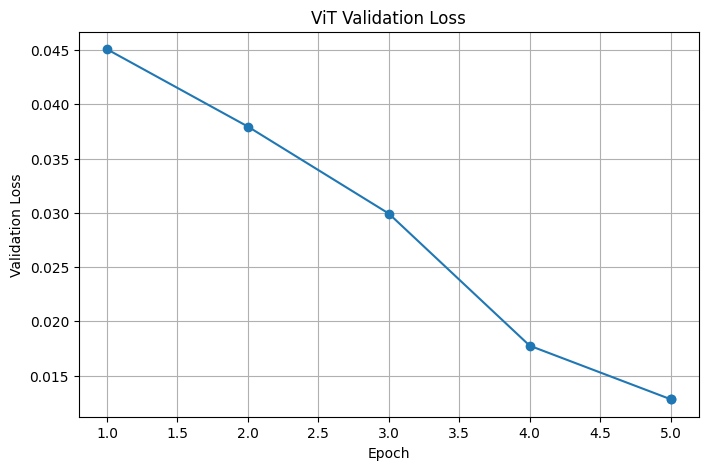

In [73]:
plt.figure(figsize=(8, 5))

plt.plot(val_epochs, val_loss, marker="o")

plt.xlabel("Epoch")
plt.ylabel("Validation Loss")
plt.title("ViT Validation Loss")

plt.grid(True)
plt.show()

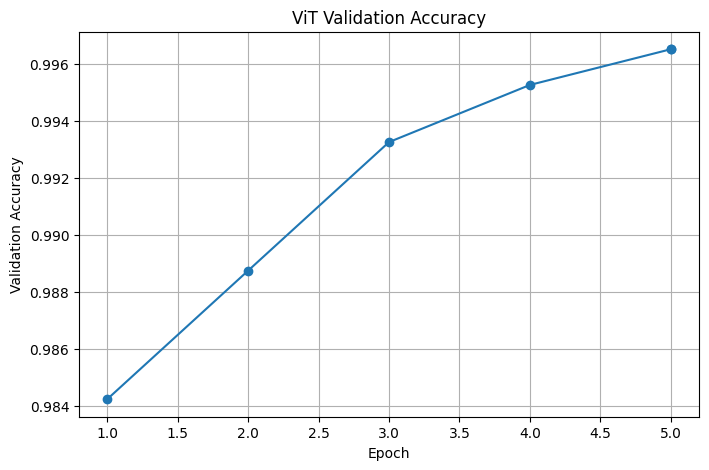

In [74]:
plt.figure(figsize=(8, 5))

plt.plot(val_epochs, val_accuracy, marker="o")

plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy")
plt.title("ViT Validation Accuracy")

plt.grid(True)
plt.show()

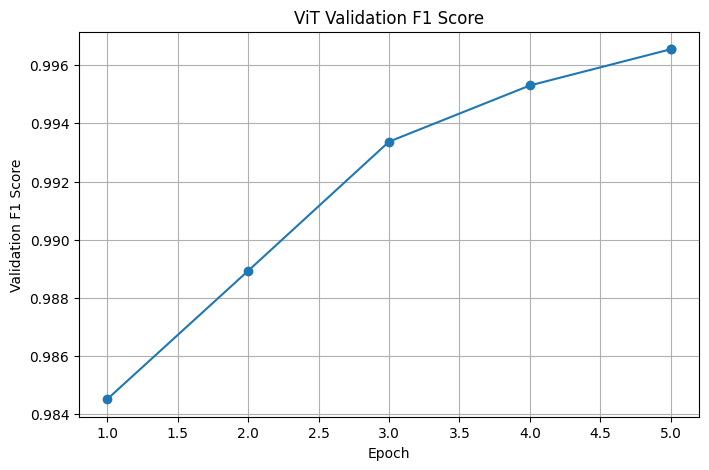

In [75]:
plt.figure(figsize=(8, 5))

plt.plot(val_epochs, val_f1, marker="o")

plt.xlabel("Epoch")
plt.ylabel("Validation F1 Score")
plt.title("ViT Validation F1 Score")

plt.grid(True)
plt.show()

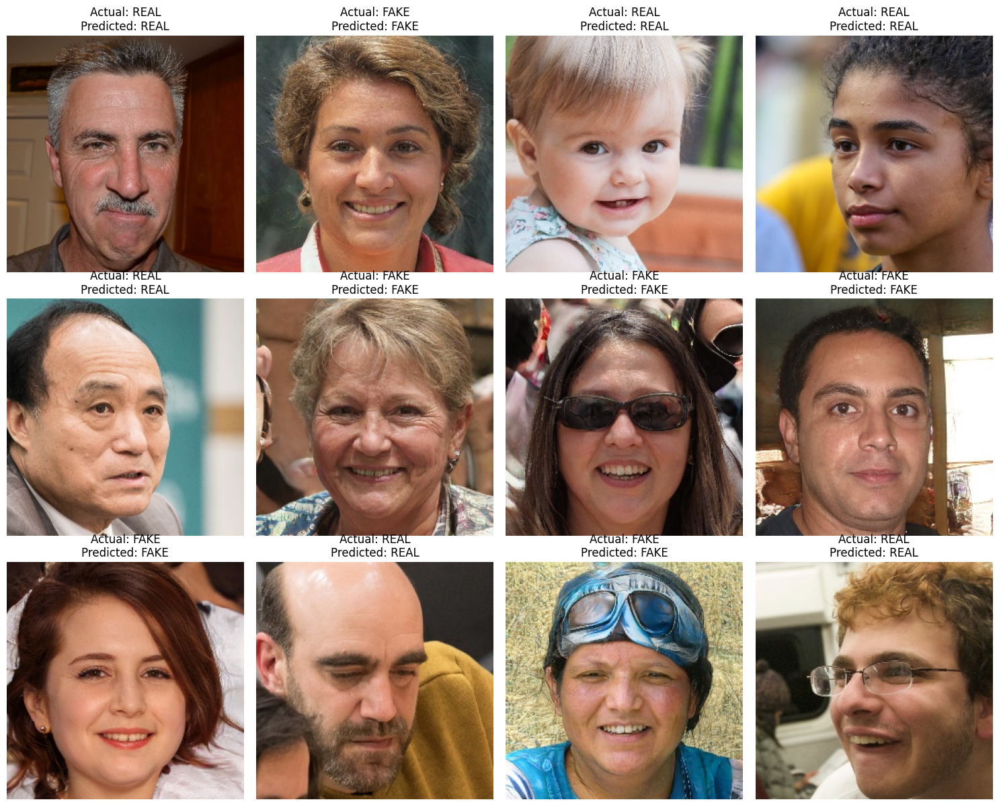

In [76]:
import random
import matplotlib.pyplot as plt

# Select 12 random test images
random_indices = random.sample(range(len(test_dataset)), 12)

plt.figure(figsize=(15, 12))

for i, idx in enumerate(random_indices):
    sample = test_dataset[idx]

    image = sample["image"].convert("RGB")
    true_label = sample["label"]

    # Get the processed image
    processed = val_test_transform(image).unsqueeze(0).to(device)

    # Make prediction
    with torch.no_grad():
        outputs = model(pixel_values=processed)
        predicted_label = torch.argmax(outputs.logits, dim=-1).item()

    true_name = "REAL" if true_label == 0 else "FAKE"
    predicted_name = "REAL" if predicted_label == 0 else "FAKE"

    plt.subplot(3, 4, i + 1)
    plt.imshow(image)
    plt.axis("off")
    plt.title(
        f"Actual: {true_name}\nPredicted: {predicted_name}"
    )

plt.tight_layout()
plt.show()

In [77]:
misclassified_indices = []

for i in range(len(test_dataset)):
    if predictions[i] != true_labels[i]:
        misclassified_indices.append(i)

print("Number of misclassified images:", len(misclassified_indices))
print("Misclassified indices:", misclassified_indices)

Number of misclassified images: 9
Misclassified indices: [399, 408, 589, 760, 1715, 2171, 3023, 3128, 3572]


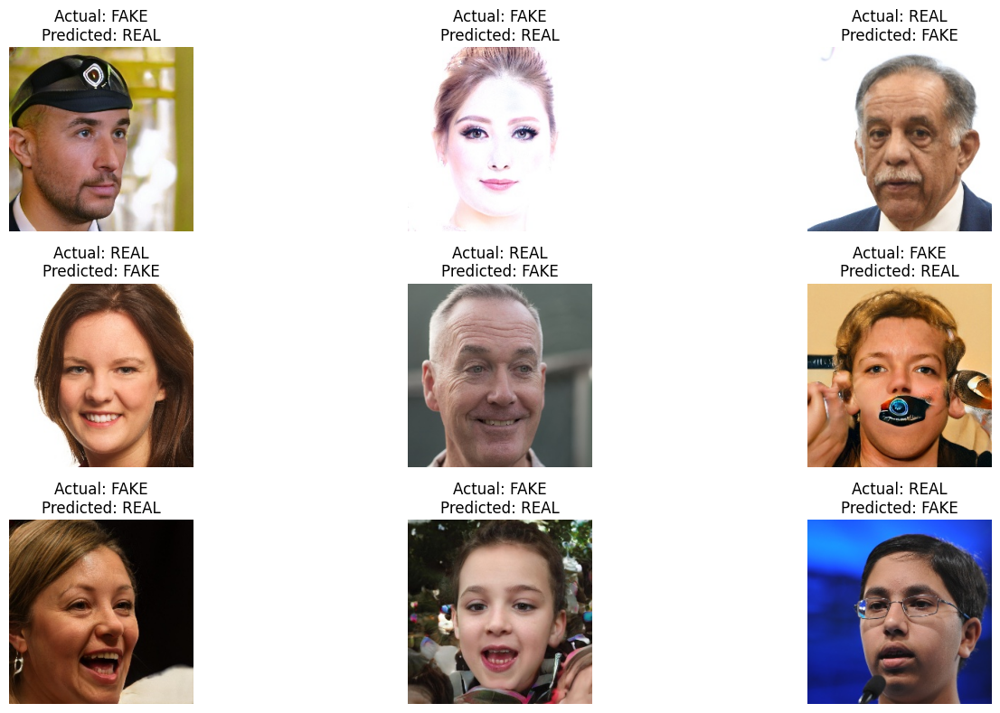

In [78]:
plt.figure(figsize=(15, 8))

for i, idx in enumerate(misclassified_indices):
    sample = test_dataset[idx]

    image = sample["image"].convert("RGB")

    actual = "REAL" if true_labels[idx] == 0 else "FAKE"
    predicted = "REAL" if predictions[idx] == 0 else "FAKE"

    plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.axis("off")
    plt.title(
        f"Actual: {actual}\nPredicted: {predicted}"
    )

plt.tight_layout()
plt.show()

In [79]:
false_real = 0
false_fake = 0

for idx in misclassified_indices:
    if true_labels[idx] == 1 and predictions[idx] == 0:
        false_real += 1
    elif true_labels[idx] == 0 and predictions[idx] == 1:
        false_fake += 1

print("FAKE predicted as REAL:", false_real)
print("REAL predicted as FAKE:", false_fake)

FAKE predicted as REAL: 5
REAL predicted as FAKE: 4


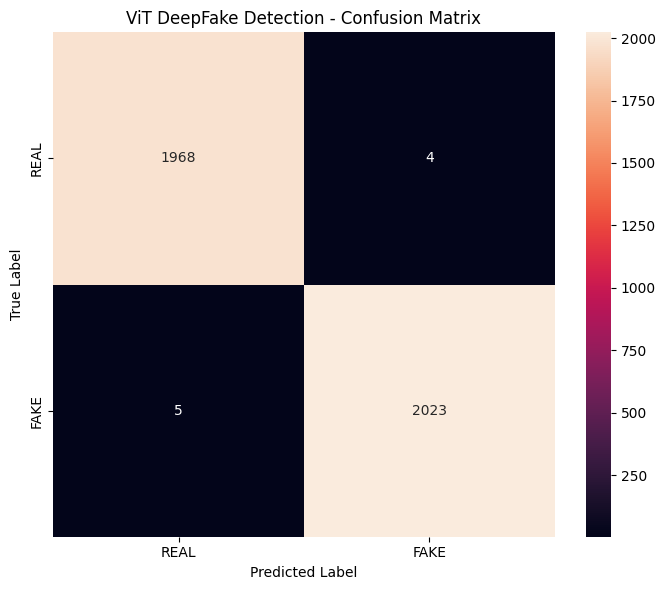

Confusion matrix saved!


In [80]:
plt.figure(figsize=(7, 6))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    xticklabels=["REAL", "FAKE"],
    yticklabels=["REAL", "FAKE"]
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("ViT DeepFake Detection - Confusion Matrix")

plt.tight_layout()

plt.savefig(
    "/content/vit_confusion_matrix.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Confusion matrix saved!")

In [81]:
MODEL_SAVE_PATH = "/content/deepfake_vit_final"

trainer.save_model(MODEL_SAVE_PATH)
processor.save_pretrained(MODEL_SAVE_PATH)

print("Final ViT model saved successfully!")
print("Location:", MODEL_SAVE_PATH)

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Final ViT model saved successfully!
Location: /content/deepfake_vit_final


In [82]:
results_df = pd.DataFrame({
    "Metric": [
        "Accuracy",
        "Precision",
        "Recall",
        "F1 Score"
    ],
    "Score": [
        test_accuracy,
        test_precision,
        test_recall,
        test_f1
    ]
})

results_df.to_csv(
    "/content/vit_test_results.csv",
    index=False
)

print(results_df)
print("\nResults saved successfully!")

      Metric     Score
0   Accuracy  0.997750
1  Precision  0.998027
2     Recall  0.997535
3   F1 Score  0.997781

Results saved successfully!


In [83]:
# --------CHANGES----------- #
from torchvision import transforms

tta_transforms = [
    # 1. Original image
    transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=processor.image_mean,
            std=processor.image_std
        )
    ]),

    # 2. Horizontally flipped image
    transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(p=1.0),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=processor.image_mean,
            std=processor.image_std
        )
    ]),

    # 3. Slight brightness change
    transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ColorJitter(brightness=0.15),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=processor.image_mean,
            std=processor.image_std
        )
    ]),

    # 4. Slight contrast change
    transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ColorJitter(contrast=0.15),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=processor.image_mean,
            std=processor.image_std
        )
    ])
]

print("TTA transformations created successfully!")
print("Number of test-time views:", len(tta_transforms))

TTA transformations created successfully!
Number of test-time views: 4


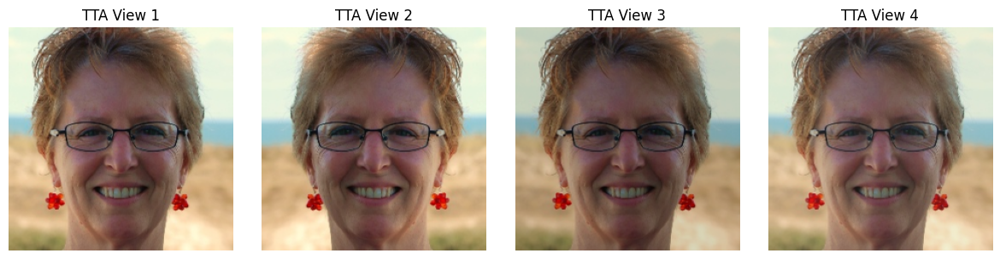

In [84]:
sample_image = test_dataset[0]["image"].convert("RGB")

plt.figure(figsize=(12, 3))

for i, transform in enumerate(tta_transforms):
    transformed_image = transform(sample_image)

    # Undo normalization just for visualization
    image_to_show = transformed_image.permute(1, 2, 0).numpy()

    mean = np.array(processor.image_mean)
    std = np.array(processor.image_std)

    image_to_show = image_to_show * std + mean
    image_to_show = np.clip(image_to_show, 0, 1)

    plt.subplot(1, 4, i + 1)
    plt.imshow(image_to_show)
    plt.axis("off")
    plt.title(f"TTA View {i+1}")

plt.tight_layout()
plt.show()

In [85]:
tta_probabilities = []

model.eval()

for idx in range(len(test_dataset)):

    image = test_dataset[idx]["image"].convert("RGB")

    view_probabilities = []

    for transform in tta_transforms:

        pixel_values = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            outputs = model(pixel_values=pixel_values)
            probabilities = torch.softmax(outputs.logits, dim=-1)

        view_probabilities.append(
            probabilities.cpu().numpy()[0]
        )

    # Average probabilities from all 4 views
    average_probability = np.mean(
        view_probabilities,
        axis=0
    )

    tta_probabilities.append(average_probability)

tta_probabilities = np.array(tta_probabilities)

print("TTA prediction completed!")
print("Shape:", tta_probabilities.shape)

TTA prediction completed!
Shape: (4000, 2)


In [86]:
tta_predictions = np.argmax(
    tta_probabilities,
    axis=1
)

tta_confidence = np.max(
    tta_probabilities,
    axis=1
)

print("TTA predictions generated!")
print("Number of predictions:", len(tta_predictions))

TTA predictions generated!
Number of predictions: 4000


In [87]:
tta_accuracy = accuracy_score(
    true_labels,
    tta_predictions
)

tta_precision = precision_score(
    true_labels,
    tta_predictions,
    zero_division=0
)

tta_recall = recall_score(
    true_labels,
    tta_predictions,
    zero_division=0
)

tta_f1 = f1_score(
    true_labels,
    tta_predictions,
    zero_division=0
)

print("TTA TEST PERFORMANCE")
print("--------------------")
print(f"Accuracy :  {tta_accuracy:.4f}")
print(f"Precision:  {tta_precision:.4f}")
print(f"Recall   :  {tta_recall:.4f}")
print(f"F1 Score :  {tta_f1:.4f}")

TTA TEST PERFORMANCE
--------------------
Accuracy :  0.9978
Precision:  0.9975
Recall   :  0.9980
F1 Score :  0.9978


In [88]:
comparison_df = pd.DataFrame({
    "Metric": [
        "Accuracy",
        "Precision",
        "Recall",
        "F1 Score"
    ],

    "Original ViT": [
        test_accuracy,
        test_precision,
        test_recall,
        test_f1
    ],

    "ViT + TTA": [
        tta_accuracy,
        tta_precision,
        tta_recall,
        tta_f1
    ]
})

print(comparison_df)

      Metric  Original ViT  ViT + TTA
0   Accuracy      0.997750   0.997750
1  Precision      0.998027   0.997536
2     Recall      0.997535   0.998028
3   F1 Score      0.997781   0.997782


In [89]:
average_confidence = np.mean(tta_confidence)

print(f"Average TTA confidence: {average_confidence:.4f}")
print(f"Average TTA confidence: {average_confidence * 100:.2f}%")

Average TTA confidence: 0.9980
Average TTA confidence: 99.80%


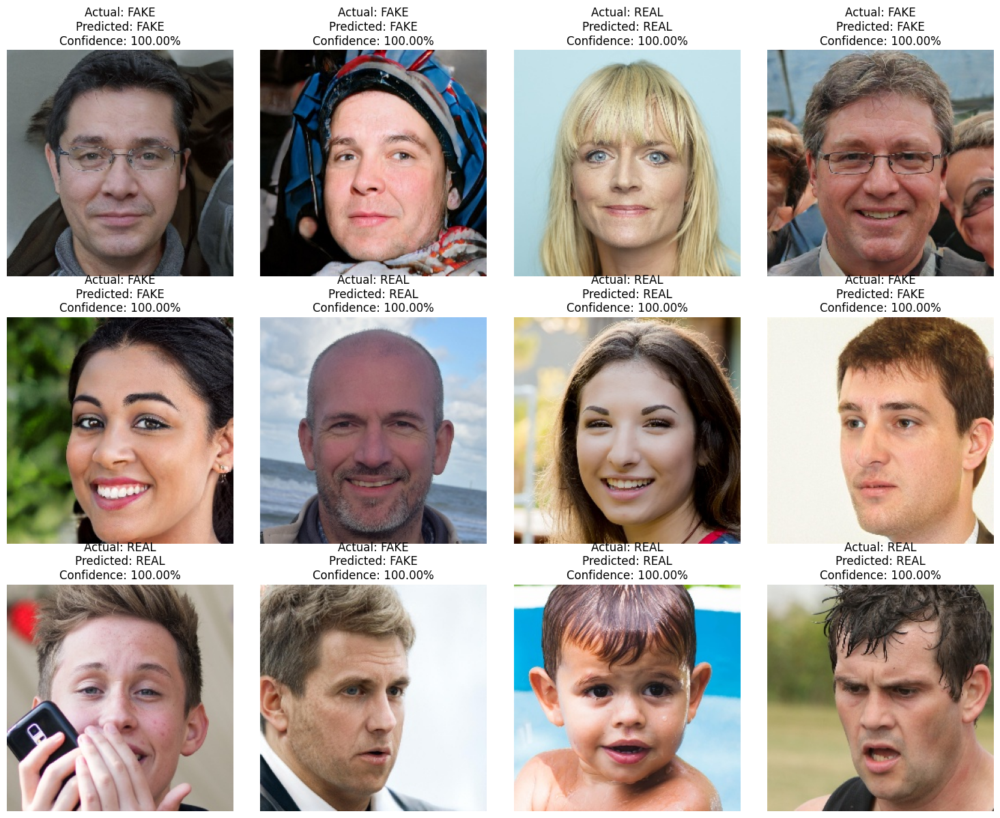

In [90]:
plt.figure(figsize=(15, 12))

sample_indices = random.sample(range(len(test_dataset)), 12)

for i, idx in enumerate(sample_indices):

    image = test_dataset[idx]["image"].convert("RGB")

    actual = "REAL" if true_labels[idx] == 0 else "FAKE"
    predicted = "REAL" if tta_predictions[idx] == 0 else "FAKE"

    confidence = tta_confidence[idx] * 100

    plt.subplot(3, 4, i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.title(
        f"Actual: {actual}\n"
        f"Predicted: {predicted}\n"
        f"Confidence: {confidence:.2f}%"
    )

plt.tight_layout()
plt.show()

In [91]:
correct_mask = tta_predictions == true_labels
incorrect_mask = tta_predictions != true_labels

correct_confidence = tta_confidence[correct_mask]
incorrect_confidence = tta_confidence[incorrect_mask]

print("Correct predictions:", len(correct_confidence))
print("Incorrect predictions:", len(incorrect_confidence))

print(
    f"\nAverage confidence - Correct: "
    f"{np.mean(correct_confidence) * 100:.2f}%"
)

print(
    f"Average confidence - Incorrect: "
    f"{np.mean(incorrect_confidence) * 100:.2f}%"
)

Correct predictions: 3991
Incorrect predictions: 9

Average confidence - Correct: 99.84%
Average confidence - Incorrect: 82.26%


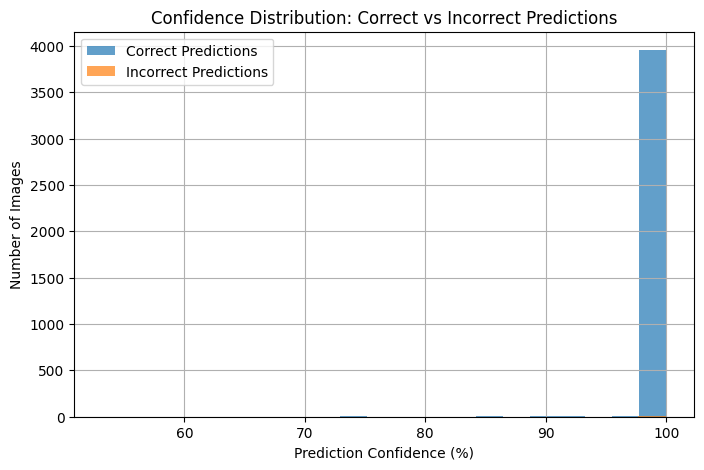

In [92]:
plt.figure(figsize=(8, 5))

plt.hist(
    correct_confidence * 100,
    bins=20,
    alpha=0.7,
    label="Correct Predictions"
)

plt.hist(
    incorrect_confidence * 100,
    bins=20,
    alpha=0.7,
    label="Incorrect Predictions"
)

plt.xlabel("Prediction Confidence (%)")
plt.ylabel("Number of Images")
plt.title("Confidence Distribution: Correct vs Incorrect Predictions")
plt.legend()
plt.grid(True)

plt.show()

In [95]:
confidence_threshold = 0.90

low_confidence_indices = np.where(
    tta_confidence < confidence_threshold
)[0]

print(
    f"Images below {confidence_threshold * 100:.0f}% confidence:",
    len(low_confidence_indices)
)

Images below 90% confidence: 28


In [96]:
print("\nFirst 20 low-confidence predictions:")

for idx in low_confidence_indices[:20]:
    actual = "REAL" if true_labels[idx] == 0 else "FAKE"
    predicted = "REAL" if tta_predictions[idx] == 0 else "FAKE"

    print(
        f"Index {idx}: "
        f"Actual={actual}, "
        f"Predicted={predicted}, "
        f"Confidence={tta_confidence[idx] * 100:.2f}%"
    )


First 20 low-confidence predictions:
Index 171: Actual=FAKE, Predicted=FAKE, Confidence=63.75%
Index 388: Actual=FAKE, Predicted=FAKE, Confidence=73.54%
Index 399: Actual=FAKE, Predicted=FAKE, Confidence=60.68%
Index 408: Actual=FAKE, Predicted=REAL, Confidence=63.98%
Index 1032: Actual=FAKE, Predicted=FAKE, Confidence=83.75%
Index 1045: Actual=FAKE, Predicted=FAKE, Confidence=75.08%
Index 1358: Actual=REAL, Predicted=REAL, Confidence=89.48%
Index 1491: Actual=REAL, Predicted=REAL, Confidence=84.27%
Index 1599: Actual=FAKE, Predicted=FAKE, Confidence=54.90%
Index 1712: Actual=REAL, Predicted=REAL, Confidence=84.45%
Index 1715: Actual=REAL, Predicted=FAKE, Confidence=77.23%
Index 1982: Actual=REAL, Predicted=FAKE, Confidence=53.21%
Index 2033: Actual=REAL, Predicted=REAL, Confidence=89.93%
Index 2111: Actual=FAKE, Predicted=FAKE, Confidence=71.71%
Index 2231: Actual=FAKE, Predicted=FAKE, Confidence=67.73%
Index 2280: Actual=REAL, Predicted=REAL, Confidence=68.33%
Index 2754: Actual=REA

In [97]:
# Identify all incorrect predictions
incorrect_indices = np.where(tta_predictions != true_labels)[0]

# Check how many incorrect predictions have confidence below 90%
incorrect_low_confidence = incorrect_indices[
    tta_confidence[incorrect_indices] < confidence_threshold
]

print("Total incorrect predictions:", len(incorrect_indices))
print("Incorrect predictions below 90% confidence:", len(incorrect_low_confidence))

if len(incorrect_indices) > 0:
    flagged_percentage = (
        len(incorrect_low_confidence) / len(incorrect_indices)
    ) * 100

    print(
        f"Percentage of errors flagged by the 90% threshold: "
        f"{flagged_percentage:.2f}%"
    )

print("\nAll incorrect predictions:")

for idx in incorrect_indices:
    actual = "REAL" if true_labels[idx] == 0 else "FAKE"
    predicted = "REAL" if tta_predictions[idx] == 0 else "FAKE"

    print(
        f"Index {idx}: "
        f"Actual={actual}, "
        f"Predicted={predicted}, "
        f"Confidence={tta_confidence[idx] * 100:.2f}%"
    )

Total incorrect predictions: 9
Incorrect predictions below 90% confidence: 4
Percentage of errors flagged by the 90% threshold: 44.44%

All incorrect predictions:
Index 408: Actual=FAKE, Predicted=REAL, Confidence=63.98%
Index 589: Actual=REAL, Predicted=FAKE, Confidence=96.19%
Index 760: Actual=REAL, Predicted=FAKE, Confidence=99.96%
Index 1715: Actual=REAL, Predicted=FAKE, Confidence=77.23%
Index 1982: Actual=REAL, Predicted=FAKE, Confidence=53.21%
Index 2171: Actual=FAKE, Predicted=REAL, Confidence=99.59%
Index 3023: Actual=FAKE, Predicted=REAL, Confidence=98.66%
Index 3128: Actual=FAKE, Predicted=REAL, Confidence=59.15%
Index 3572: Actual=REAL, Predicted=FAKE, Confidence=92.37%


TTA Confusion Matrix:
[[1967    5]
 [   4 2024]]


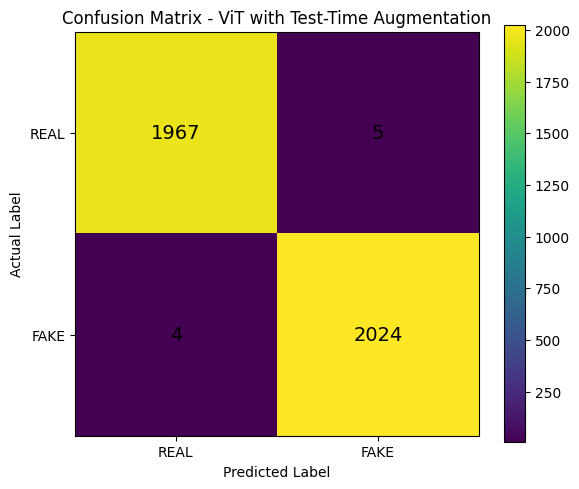

In [98]:
# Generate confusion matrix for TTA predictions
tta_cm = confusion_matrix(true_labels, tta_predictions)

print("TTA Confusion Matrix:")
print(tta_cm)

plt.figure(figsize=(6, 5))

plt.imshow(tta_cm, interpolation="nearest")
plt.title("Confusion Matrix - ViT with Test-Time Augmentation")
plt.colorbar()

plt.xticks([0, 1], ["REAL", "FAKE"])
plt.yticks([0, 1], ["REAL", "FAKE"])

plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")

# Add values inside the matrix
for i in range(2):
    for j in range(2):
        plt.text(
            j,
            i,
            tta_cm[i, j],
            ha="center",
            va="center",
            fontsize=14
        )

plt.tight_layout()
plt.show()

In [99]:
# Save TTA prediction results

tta_results_df = pd.DataFrame({
    "true_label": true_labels,
    "predicted_label": tta_predictions,
    "confidence": tta_confidence
})

# Convert numeric labels to readable labels
tta_results_df["true_label"] = tta_results_df["true_label"].map({
    0: "REAL",
    1: "FAKE"
})

tta_results_df["predicted_label"] = tta_results_df["predicted_label"].map({
    0: "REAL",
    1: "FAKE"
})

tta_results_df["correct"] = (
    tta_results_df["true_label"] ==
    tta_results_df["predicted_label"]
)

tta_results_df.to_csv(
    "/content/vit_tta_results.csv",
    index=False
)

print("TTA results saved successfully.")
print("File: /content/vit_tta_results.csv")
print("\nFirst 5 rows:")
print(tta_results_df.head())

TTA results saved successfully.
File: /content/vit_tta_results.csv

First 5 rows:
  true_label predicted_label  confidence  correct
0       REAL            REAL    0.999996     True
1       REAL            REAL    0.999997     True
2       REAL            REAL    0.999999     True
3       FAKE            FAKE    0.999993     True
4       REAL            REAL    0.999998     True


      Metric  Original ViT  ViT + TTA
0   Accuracy      0.997750   0.997750
1  Precision      0.998027   0.997536
2     Recall      0.997535   0.998028
3   F1 Score      0.997781   0.997782


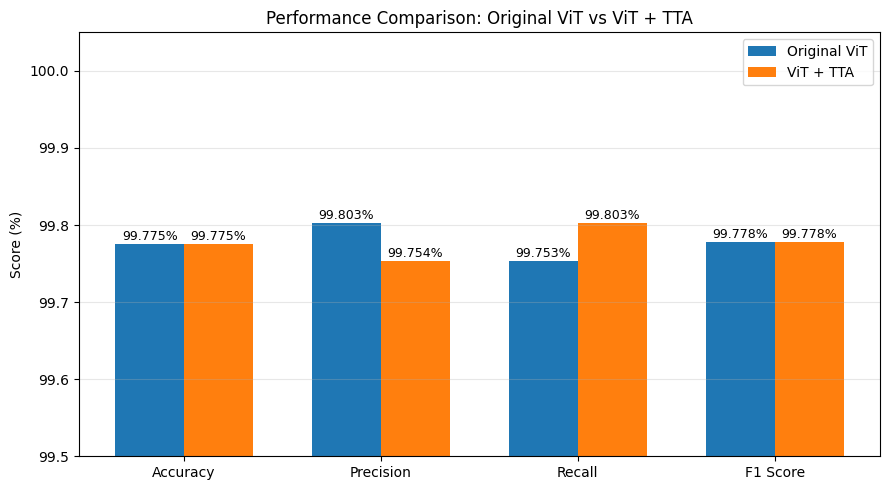

In [100]:
# Final comparison of Original ViT vs ViT + TTA

comparison_df = pd.DataFrame({
    "Metric": ["Accuracy", "Precision", "Recall", "F1 Score"],
    "Original ViT": [
        0.997750,
        0.998027,
        0.997535,
        0.997781
    ],
    "ViT + TTA": [
        0.997750,
        0.997536,
        0.998028,
        0.997782
    ]
})

# Display values
print(comparison_df)

# Plot comparison
x = np.arange(len(comparison_df["Metric"]))
width = 0.35

plt.figure(figsize=(9, 5))

plt.bar(
    x - width/2,
    comparison_df["Original ViT"] * 100,
    width,
    label="Original ViT"
)

plt.bar(
    x + width/2,
    comparison_df["ViT + TTA"] * 100,
    width,
    label="ViT + TTA"
)

plt.xticks(x, comparison_df["Metric"])
plt.ylabel("Score (%)")
plt.ylim(99.5, 100.05)
plt.title("Performance Comparison: Original ViT vs ViT + TTA")
plt.legend()
plt.grid(axis="y", alpha=0.3)

# Add values above bars
for i, value in enumerate(comparison_df["Original ViT"] * 100):
    plt.text(
        i - width/2,
        value + 0.005,
        f"{value:.3f}%",
        ha="center",
        fontsize=9
    )

for i, value in enumerate(comparison_df["ViT + TTA"] * 100):
    plt.text(
        i + width/2,
        value + 0.005,
        f"{value:.3f}%",
        ha="center",
        fontsize=9
    )

plt.tight_layout()
plt.show()